In [78]:
#importing packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [80]:
data = pd.read_excel('Online Retail.xlsx')
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [82]:
df=data.copy(deep=True)

In [84]:
print(f'The data has {df.shape[0]} rows and {df.shape[1]} columns')

The data has 541909 rows and 8 columns


In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [88]:
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [90]:
df.nunique()

InvoiceNo      25900
StockCode       4070
Description     4223
Quantity         722
InvoiceDate    23260
UnitPrice       1630
CustomerID      4372
Country           38
dtype: int64

In [92]:
df.Country.value_counts(normalize=True)*100

United Kingdom          91.431956
Germany                  1.752139
France                   1.579047
EIRE                     1.512431
Spain                    0.467422
Netherlands              0.437527
Belgium                  0.381798
Switzerland              0.369435
Portugal                 0.280305
Australia                0.232327
Norway                   0.200403
Italy                    0.148180
Channel Islands          0.139876
Finland                  0.128250
Cyprus                   0.114779
Sweden                   0.085254
Unspecified              0.082302
Austria                  0.073998
Denmark                  0.071783
Japan                    0.066063
Poland                   0.062926
Israel                   0.054806
USA                      0.053699
Hong Kong                0.053145
Singapore                0.042258
Iceland                  0.033585
Canada                   0.027864
Greece                   0.026942
Malta                    0.023436
United Arab Em

From the data above, we can observe that 91% of the customers are from United Kingdom, so it will be wise we base our analysis on them

In [94]:
df= df[df.Country =='United Kingdom']

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 495478 entries, 0 to 541893
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    495478 non-null  object        
 1   StockCode    495478 non-null  object        
 2   Description  494024 non-null  object        
 3   Quantity     495478 non-null  int64         
 4   InvoiceDate  495478 non-null  datetime64[ns]
 5   UnitPrice    495478 non-null  float64       
 6   CustomerID   361878 non-null  float64       
 7   Country      495478 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 34.0+ MB


In [98]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,495478.000000,495478.000000,361878.000000
mean,8.605486,4.532422,15547.871368
std,227.588756,99.315438,1594.402590
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,14194.000000
50%,3.000000,2.100000,15514.000000
75%,10.000000,4.130000,16931.000000
max,80995.000000,38970.000000,18287.000000


From the descriptive statistics, It can be observed that Quantity and Unit Price have negative values


In [100]:
#We remove the negative values from the Quantity and UnitPrice columns
df= df[(df.Quantity >0) & (df.UnitPrice>0)]

In [102]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,485123.000000,485123.000000,354321.000000
mean,9.610738,3.849679,15552.486392
std,161.904143,34.677371,1594.527150
min,1.000000,0.001000,12346.000000
25%,1.000000,1.250000,14194.000000
50%,3.000000,2.100000,15522.000000
75%,10.000000,4.130000,16931.000000
max,80995.000000,13541.330000,18287.000000


In [104]:
df.isna().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     130802
Country             0
dtype: int64

In [106]:
#removing data with no customer id 

df=df.dropna(subset=['CustomerID'])

In [108]:
df.isnull().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [110]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [112]:
#creating a new column for the revenue generated
df['Revenue']= df['Quantity']*df['UnitPrice']

In [114]:
from datetime import datetime,date

In [116]:
from datetime import datetime

df.InvoiceDate = pd.to_datetime(df['InvoiceDate'])

df['Transaction_date'] = df['InvoiceDate'].dt.strftime('%Y-%m-%d')

df['Transaction_date'] = pd.to_datetime(df['Transaction_date'])

In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 354321 entries, 0 to 541893
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   InvoiceNo         354321 non-null  object        
 1   StockCode         354321 non-null  object        
 2   Description       354321 non-null  object        
 3   Quantity          354321 non-null  int64         
 4   InvoiceDate       354321 non-null  datetime64[ns]
 5   UnitPrice         354321 non-null  float64       
 6   CustomerID        354321 non-null  float64       
 7   Country           354321 non-null  object        
 8   Revenue           354321 non-null  float64       
 9   Transaction_date  354321 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(3), int64(1), object(4)
memory usage: 29.7+ MB


In [120]:
#finding the maximum and minimum dates

print(f"The recent date of purchase is {max(df['Transaction_date']).date()}")
print(f"The last date of purchase is {max(df['Transaction_date']).date()}")

The recent date of purchase is 2011-12-09
The last date of purchase is 2011-12-09


In [122]:
import datetime

now = datetime.datetime(2023, 12, 9, 10, 30, 0)
now= now.date()

print(now)



2023-12-09


In [124]:
max_date=df['Transaction_date'].max()
max_date

Timestamp('2011-12-09 00:00:00')

In [126]:
#creating an RFM table


rfm_table = df.groupby(['CustomerID']).agg({'Transaction_date':lambda date : (max_date - date.max()).days,
                                          'Quantity': lambda x:len(x),
                                           'Revenue': lambda x:x.sum() 
                                          })
rfm_table

,Transaction_date,Quantity,Revenue
CustomerID,,,
12346.0,325,1,77183.600
12747.0,2,103,4196.010
12748.0,0,4595,33719.730
12749.0,3,199,4090.880
12820.0,3,59,942.340
12821.0,214,6,92.720
12822.0,70,46,948.880
12823.0,74,5,1759.500
12824.0,59,25,397.120


In [128]:
rfm_table.rename(columns={'Transaction_date': 'Recency',
                  'Quantity': 'Frequency',
                  'Revenue': 'Monetary'}, inplace=True)

In [130]:
rfm_table

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,325,1,77183.600
12747.0,2,103,4196.010
12748.0,0,4595,33719.730
12749.0,3,199,4090.880
12820.0,3,59,942.340
12821.0,214,6,92.720
12822.0,70,46,948.880
12823.0,74,5,1759.500
12824.0,59,25,397.120


In [132]:
quantiles = rfm_table.quantile(q=[0.25,0.50,0.75])
quantiles = quantiles.to_dict()

In [134]:
# creating a function for each quantile in the columns of the dataframe
def score(x,y,z):
    if x<=z[y][0.25]:
        return 4
    elif x<=z[y][0.5]:
        return 3
    elif x<=z[y][0.75]:
        return 2
    else :
        return 1
    
def Dscore(a,b,c):
    if a<=c[b][0.25]:
        return 1
    elif a<=c[b][0.5]:
        return 2
    elif a<=c[b][0.75]:
        return 3
    else :
        return 4

In [136]:
rfm_table['Rec_Quartile']=rfm_table['Recency'].apply(score,args=('Recency',quantiles))
rfm_table['Freq_Quartile']=rfm_table['Frequency'].apply(Dscore,args=('Frequency',quantiles))
rfm_table['Mon_Quartile']=rfm_table['Monetary'].apply(Dscore,args=('Monetary',quantiles))

In [138]:
#creating RFM_score column

rfm_table['RFM_Score']= 100*(rfm_table['Rec_Quartile'])+10*(rfm_table['Freq_Quartile'])+(rfm_table['Mon_Quartile'])


In [140]:
#creating a column for the customer title

def prize(a):
  
    if a >= 444:
        return 'Platinum Customer'
    elif a >=433 and a < 444:
        return 'Potential Loyalists'
    elif a >=421 and a < 433:
        return 'Becoming Loyal'
    elif a >=344 and a < 421:
        return 'Recent Customer'
    elif a >=323 and a < 344:
        return 'Potential Customer'
    elif a >=311 and a < 323:
        return 'Late Bloomer'
    elif a >=224 and a < 311:
        return 'Loosing Customer'
    elif a >=212 and a < 224:
        return 'At Risk Customer'
    elif a >=124 and a < 212:
        return 'Almost Lost Customer'
    elif a >=112 and a < 124:
        return 'Hibernating Customer'
    else :
        return 'Lost Customer'

In [142]:
rfm_table['Customer_Title']= rfm_table['RFM_Score'].apply(prize)

In [144]:
rfm_table

,Recency,Frequency,Monetary,Rec_Quartile,Freq_Quartile,Mon_Quartile,RFM_Score,Customer_Title
CustomerID,,,,,,,,
12346.0,325,1,77183.600,1,1,4,114,Hibernating Customer
12747.0,2,103,4196.010,4,4,4,444,Platinum Customer
12748.0,0,4595,33719.730,4,4,4,444,Platinum Customer
12749.0,3,199,4090.880,4,4,4,444,Platinum Customer
12820.0,3,59,942.340,4,3,3,433,Potential Loyalists
12821.0,214,6,92.720,1,1,1,111,Lost Customer
12822.0,70,46,948.880,2,3,3,233,Loosing Customer
12823.0,74,5,1759.500,2,1,4,214,At Risk Customer
12824.0,59,25,397.120,2,2,2,222,At Risk Customer


In [146]:
pd.set_option('display.max_rows',None)

In [147]:
rfm_table['Customer_Title'].value_counts()

Potential Customer      458
Hibernating Customer    440
Loosing Customer        421
Platinum Customer       409
At Risk Customer        380
Almost Lost Customer    364
Lost Customer           343
Late Bloomer            325
Potential Loyalists     300
Recent Customer         283
Becoming Loyal          197
Name: Customer_Title, dtype: int64

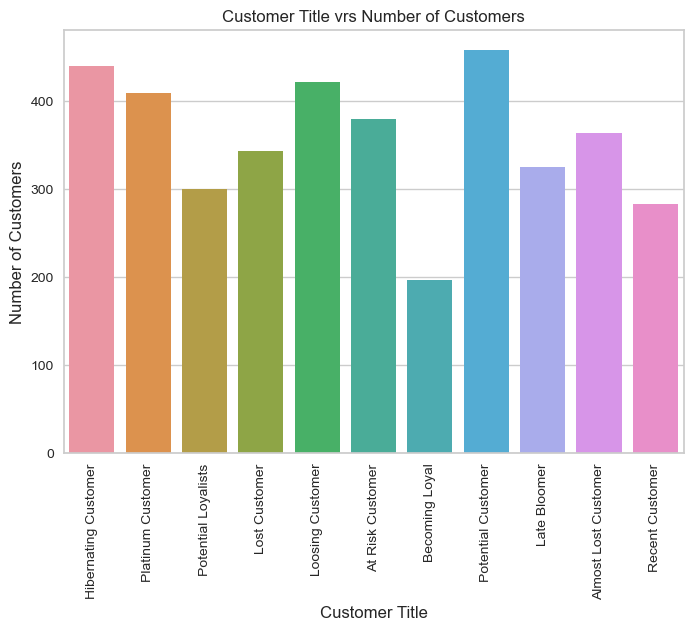

In [148]:
sns.countplot(data=rfm_table, x= rfm_table['Customer_Title'])
plt.xlabel('Customer Title')
plt.ylabel('Number of Customers')
plt.title('Customer Title vrs Number of Customers')
plt.xticks(rotation=90)
plt.show()

In [149]:
rfm_table

,Recency,Frequency,Monetary,Rec_Quartile,Freq_Quartile,Mon_Quartile,RFM_Score,Customer_Title
CustomerID,,,,,,,,
12346.0,325,1,77183.600,1,1,4,114,Hibernating Customer
12747.0,2,103,4196.010,4,4,4,444,Platinum Customer
12748.0,0,4595,33719.730,4,4,4,444,Platinum Customer
12749.0,3,199,4090.880,4,4,4,444,Platinum Customer
12820.0,3,59,942.340,4,3,3,433,Potential Loyalists
12821.0,214,6,92.720,1,1,1,111,Lost Customer
12822.0,70,46,948.880,2,3,3,233,Loosing Customer
12823.0,74,5,1759.500,2,1,4,214,At Risk Customer
12824.0,59,25,397.120,2,2,2,222,At Risk Customer


In [150]:
#creating a rank for the each customer 

def rank(a):
  
    if a == 'Platinum Customer':
        return 1
    elif a == 'Potential Loyalists':
        return 2
    elif a == 'Becoming Loyal':
        return 3
    elif a == 'Recent Customer':
        return 4
    elif a == 'Potential Customer':
        return 5
    elif a == 'Late Bloomer':
        return 6
    elif a == 'Loosing Customer':
        return 7
    elif a == 'At Risk Customer':
        return 8
    elif a == 'Almost Lost Customer':
        return 9
    elif a == 'Hibernating Customer':
        return 10
    else :
        return 11

In [151]:
#creating a new column for a customer rank

rfm_table['Customer_Rank']= rfm_table['Customer_Title'].apply(rank)

In [152]:
rfm_table

,Recency,Frequency,Monetary,Rec_Quartile,Freq_Quartile,Mon_Quartile,RFM_Score,Customer_Title,Customer_Rank
CustomerID,,,,,,,,,
12346.0,325,1,77183.600,1,1,4,114,Hibernating Customer,10
12747.0,2,103,4196.010,4,4,4,444,Platinum Customer,1
12748.0,0,4595,33719.730,4,4,4,444,Platinum Customer,1
12749.0,3,199,4090.880,4,4,4,444,Platinum Customer,1
12820.0,3,59,942.340,4,3,3,433,Potential Loyalists,2
12821.0,214,6,92.720,1,1,1,111,Lost Customer,11
12822.0,70,46,948.880,2,3,3,233,Loosing Customer,7
12823.0,74,5,1759.500,2,1,4,214,At Risk Customer,8
12824.0,59,25,397.120,2,2,2,222,At Risk Customer,8


In [153]:
new_df = rfm_table[['Recency', 'Frequency', 'Monetary']]
new_df.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,325,1,77183.60
12747.0,2,103,4196.01
12748.0,0,4595,33719.73
12749.0,3,199,4090.88
12820.0,3,59,942.34


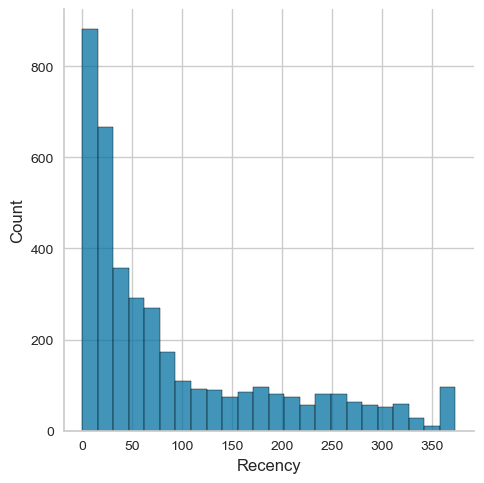

<Figure size 500x500 with 0 Axes>

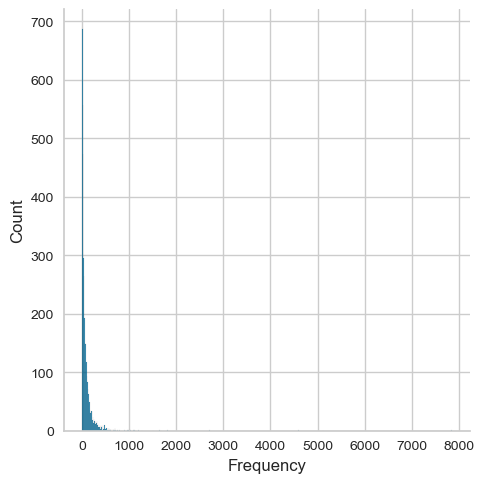

<Figure size 500x500 with 0 Axes>

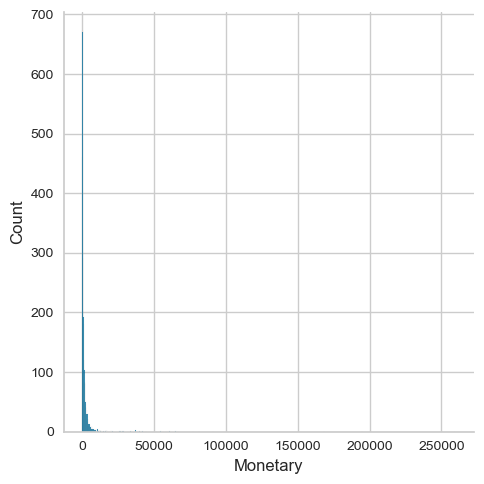

<Figure size 500x500 with 0 Axes>

In [154]:
for feature in new_df:
    sns.displot(new_df[feature])
    plt.figure(figsize=(5,5))
    plt.show()


Since the data is highly skewed, we perform a log transformation in order to reduce skewness and making the data more normally distributed


In [155]:
rfm_data_log = new_df.copy()
rfm_data_log = np.log(rfm_data_log + 1)

In [156]:
rfm_data_log.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,5.786897,0.693147,11.253955
12747.0,1.098612,4.644391,8.342128
12748.0,0.000000,8.432942,10.425868
12749.0,1.386294,5.298317,8.316760
12820.0,1.386294,4.094345,6.849427


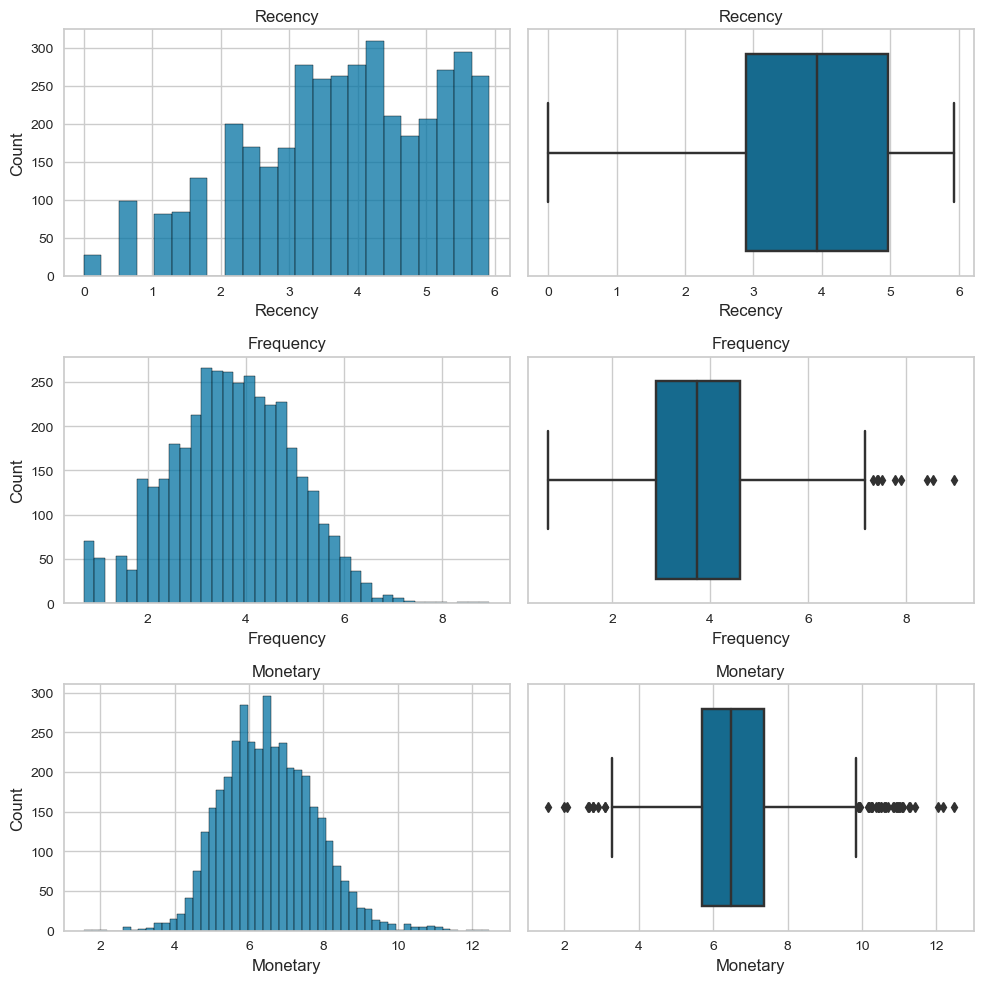

In [157]:
# plt.show()
fig, axs = plt.subplots(3, 2, figsize=(10, 10))

for i, feature in enumerate(rfm_data_log):
    b=0
    sns.histplot( x=rfm_data_log[feature], ax=axs[i][b])
    axs[i][b].set_title(feature)
    sns.boxplot( x=rfm_data_log[feature], ax=axs[i][b+1])
    axs[i][b+1].set_title(feature)

plt.tight_layout()
plt.show()



In [158]:
from scipy.stats import mstats
from feature_engine.outliers import Winsorizer

In [159]:
windsoriser = Winsorizer(tail='both', # cap left, right or both tails 
                          fold=2,
                           variables=[ 'Recency', 'Frequency', 'Monetary']
                        )
windsoriser.fit(rfm_data_log)
rfm_log_wins = windsoriser.transform(rfm_data_log)

In [160]:
rfm_log_wins

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,5.786897,1.201406,9.033167
12747.0,1.098612,4.644391,8.342128
12748.0,1.034417,6.241314,9.033167
12749.0,1.386294,5.298317,8.316760
12820.0,1.386294,4.094345,6.849427
12821.0,5.370638,1.945910,4.540312
12822.0,4.262680,3.850148,6.856336
12823.0,4.317488,1.791759,7.473353
12824.0,4.094345,3.258097,5.986753


In [161]:
from sklearn.preprocessing import StandardScaler


In [162]:
scaler=StandardScaler()
scaler.fit(rfm_log_wins)
rfm_scaled= scaler.transform(rfm_log_wins)

In [163]:
rfm_scaled_df= pd.DataFrame(rfm_scaled,columns=rfm_log_wins.columns)
rfm_scaled_df

,Recency,Frequency,Monetary
0,1.465314,-2.075553,2.144184
1,-2.017962,0.758501,1.551863
2,-2.065658,2.072989,2.144184
3,-1.804222,1.296773,1.530119
4,-1.804222,0.305737,0.272403
5,1.156044,-1.462722,-1.706843
6,0.332860,0.104729,0.278325
7,0.373581,-1.589610,0.807198
8,0.207791,-0.382611,-0.467033
9,-2.017962,0.657582,0.655953


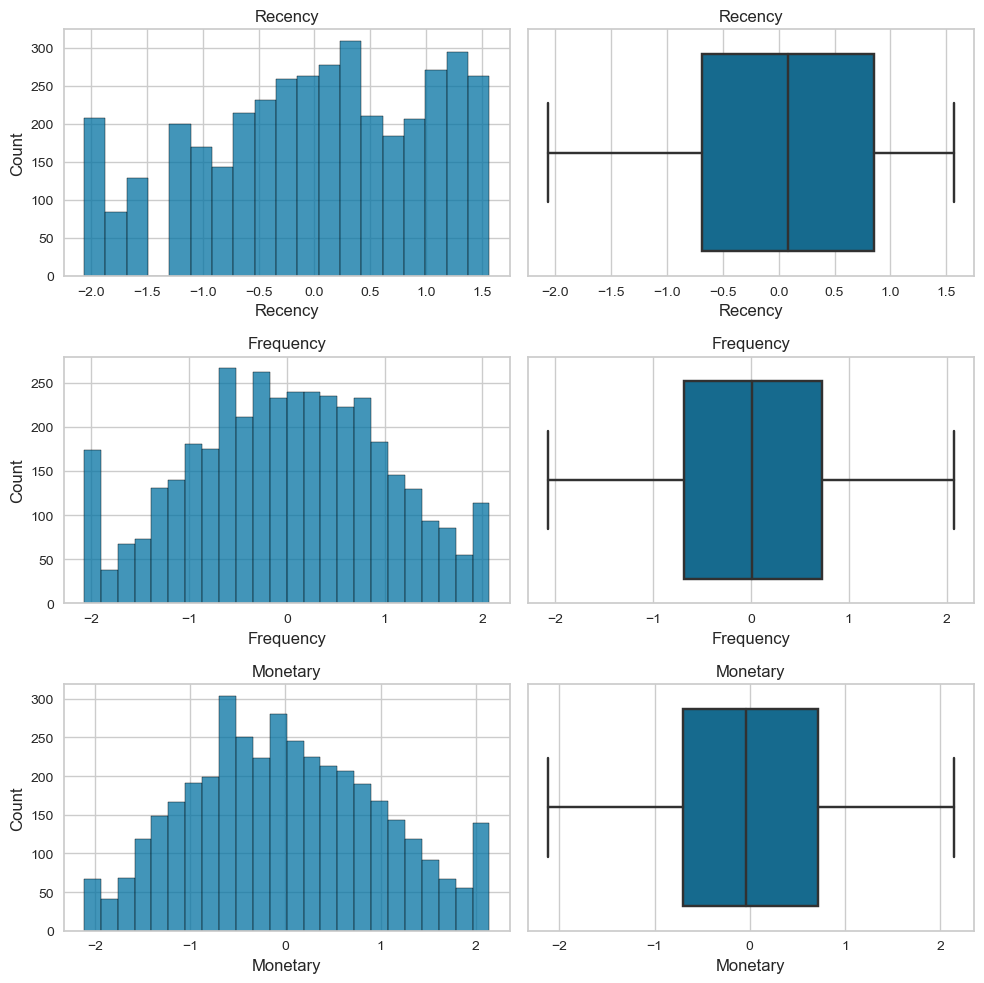

In [164]:
# showing the distribution after performing winsorization to remove data 2 standard deviations above the mean and performing 
#standardizing to standardize the data
fig, axs = plt.subplots(3, 2, figsize=(10, 10))

for i, feat in enumerate(rfm_scaled_df):
    b=0
    sns.histplot( x=rfm_scaled_df[feat], ax=axs[i][b])
    axs[i][b].set_title(feat)
    sns.boxplot( x=rfm_scaled_df[feat], ax=axs[i][b+1])
    axs[i][b+1].set_title(feat)

plt.tight_layout()
plt.show()

In [165]:
from sklearn.cluster import KMeans

In [166]:
rfm_scaled_df.shape

(3920, 3)

In [167]:
import warnings
warnings.filterwarnings('ignore')

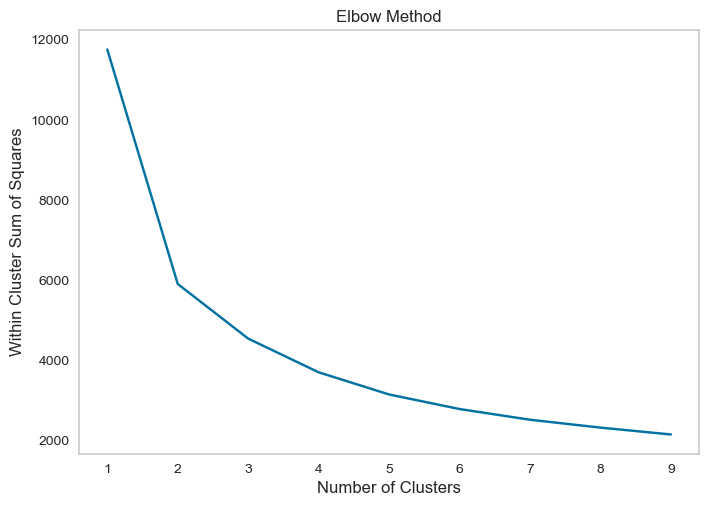

In [186]:
wcss=[]
for n in range(1,10):
    Kmeans= KMeans(n_clusters=n, init='k-means++',random_state=42)
    Kmeans.fit(rfm_scaled_df)
    wcss.append(Kmeans.inertia_)
plt.plot(range(1,10),wcss,'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.title('Elbow Method')
plt.grid()
plt.show()

In [169]:
from yellowbrick.cluster import SilhouetteVisualizer

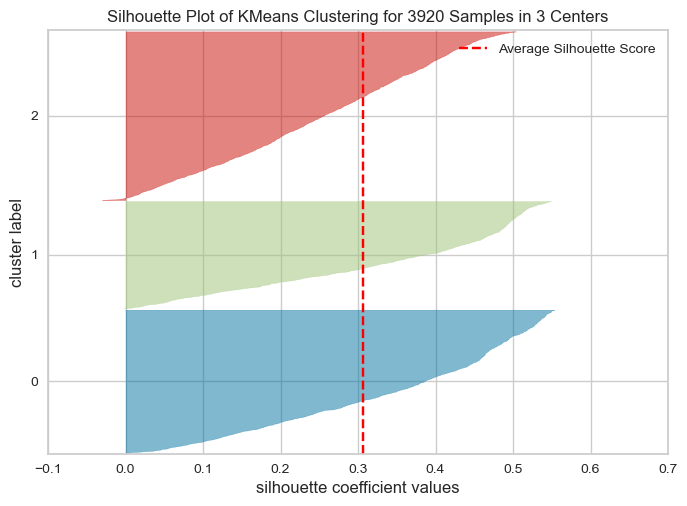

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 3920 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [170]:
kmeans_3=KMeans(n_clusters=3,init='k-means++',random_state=42)
visualizer= SilhouetteVisualizer(kmeans_3,colors='yellowbrick')
visualizer.fit(rfm_scaled_df)
visualizer.show()

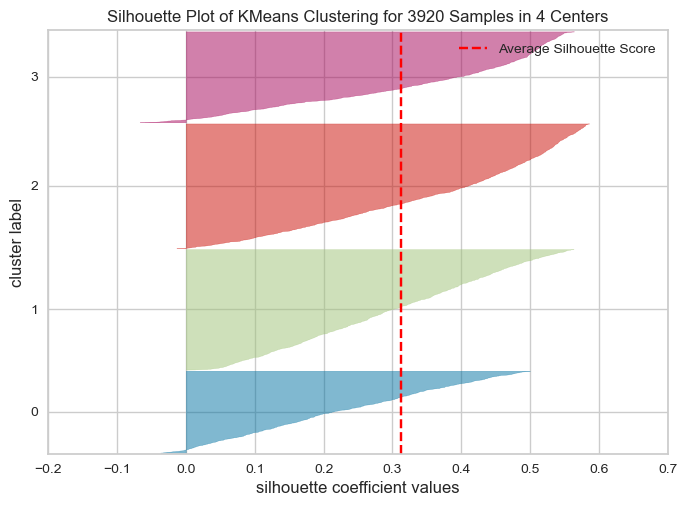

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 3920 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [171]:
kmeans_4=KMeans(n_clusters=4,init='k-means++',random_state=42)
visualizer= SilhouetteVisualizer(kmeans_4,colors='yellowbrick')
visualizer.fit(rfm_scaled_df)
visualizer.show()

In [172]:
from sklearn.metrics import silhouette_score

In [173]:
kmeans_3_silhouette_avg=silhouette_score(rfm_scaled_df,kmeans_3.labels_)
kmeans_4_silhouette_avg=silhouette_score(rfm_scaled_df,kmeans_4.labels_)

print('The Silhouette Score for 3 Clusters using Kmeans is:',kmeans_3_silhouette_avg)
print('The Silhouette Score for 4 Clusters using Kmeans is:',kmeans_4_silhouette_avg)

The Silhouette Score for 3 Clusters using Kmeans is: 0.30679539139521866
The Silhouette Score for 4 Clusters using Kmeans is: 0.31304776931884615


In [174]:
import scipy.cluster.hierarchy as hr


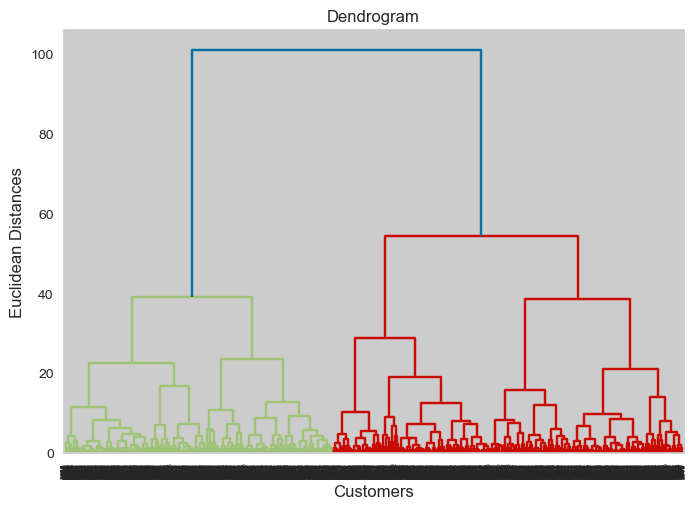

In [175]:
dendogram=hr.dendrogram(hr.linkage(rfm_scaled_df,method='ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distances')
plt.show()

From the dendrogram, the number of clusters is 3 as there are large jumps in the merging distances

In [176]:
from scipy.cluster.hierarchy import cophenet

In [177]:
cophenet_score=np.mean(cophenet(hr.linkage(rfm_scaled_df)))
cophenet_score

0.20519037390149136

In [178]:
from sklearn.cluster import AgglomerativeClustering

In [179]:
Ac=AgglomerativeClustering(n_clusters=3,affinity='euclidean',linkage='ward')
Ag_predicted=Ac.fit_predict(rfm_scaled_df)

# Calculating the Avg Silhouette Score for each model

In [180]:
Ag_Sil_score=silhouette_score(rfm_scaled_df,Ag_predicted)

print('The Silhouette Score for the Kmeans Algorithm is:',kmeans_3_silhouette_avg,
     '\nThe Silhouette Score for the Agglomerative Clustering Algorithm is:',Ag_Sil_score)

The Silhouette Score for the Kmeans Algorithm is: 0.30679539139521866 
The Silhouette Score for the Agglomerative Clustering Algorithm is: 0.2608388941567899


In [181]:
from sklearn.metrics import davies_bouldin_score

In [182]:
km_db_score= davies_bouldin_score(rfm_scaled_df,kmeans_3.labels_)
Ag_db_score= davies_bouldin_score(rfm_scaled_df,Ag_predicted)

print('The Davies Bouldin Score for the Kmeans Algorithm is:',km_db_score,
     '\nThe Davies Bouldin Score for the Agglomerative Clustering Algorithm is:',Ag_db_score )

The Davies Bouldin Score for the Kmeans Algorithm is: 1.122601581478514 
The Davies Bouldin Score for the Agglomerative Clustering Algorithm is: 1.2130498078256113


In [183]:
from sklearn.cluster import DBSCAN

In [184]:
from itertools import product

eps= np.arange(0.1,0.5,0.025)
min_samples= np.arange(1,10)
params= list(product(eps,min_samples))

In [185]:
n_clusters=[]
sil_score=[]

for i in params:

    # create a DBSCAN object with specified parameters
    dbscan = DBSCAN(eps=i[0], min_samples=i[1])

    # fit the data to the DBSCAN model
    dbscan.fit(rfm_scaled_df)

    # get the cluster labels for each data point
    labels = dbscan.labels_

    # get the number of clusters found by the algorithm
    n_clusters.append(len(set(labels)))
    sil_score.append(silhouette_score(rfm_scaled_df,labels))
    


In [202]:
dataframe_dbs=pd.DataFrame(params,columns=['Eps','Min_Samples'])
dataframe_dbs['Clusters']=n_clusters
dataframe_dbs['Sil_Score']= sil_score
#finding the highest silhouette score for the data
max_params=dataframe_dbs['Sil_Score'].max()

In [203]:
#determing the eps and the min values that gave the best silhouette score

dataframe_dbs[dataframe_dbs['Sil_Score'] == max_params]

,Eps,Min_Samples,Clusters,Sil_Score
130,0.45,5,2,0.250029


In [207]:
dataframe_dbs.groupby('Clusters').size()

Clusters
2       21
3       11
4        9
5        9
6        5
7        3
8        5
9        3
10       2
11       3
12       2
13       3
15       1
16       2
17       1
18       1
19       2
20       1
21       1
22       1
24       2
25       4
28       2
29       1
30       2
31       2
33       1
34       1
35       1
36       2
39       2
40       1
43       1
47       1
48       1
49       1
50       1
54       2
57       1
63       1
68       1
70       1
73       1
77       1
78       1
81       1
92       1
97       1
112      1
115      1
121      1
124      1
134      1
154      1
162      1
210      1
218      2
249      1
315      1
320      1
447      1
473      1
522      1
708      1
1085     1
1615     1
2246     1
dtype: int64

In [214]:
#fitting the best parameters into the eps and the min_samples
# create a DBSCAN object with specified parameters
dbscan = DBSCAN(eps=0.45, min_samples=5)

# fit the data to the DBSCAN model
dbscan.fit(rfm_scaled_df)

# get the cluster labels for each data point
new_labels = dbscan.labels_


dbscan_db_score= davies_bouldin_score(rfm_scaled_df,new_labels)
dbscan_db_score

2.0731760001916126

Evaluating the different Clustering Techniques on the data

In [217]:
Clustering_Techniques=(['Silhouette_Score',kmeans_3_silhouette_avg,Ag_Sil_score,max_params],
                      ['David_Bouldin_Score',km_db_score,Ag_db_score,dbscan_db_score])
evaluate_models=pd.DataFrame(Clustering_Techniques, 
                             columns=['Model','KMeans','Agg Clustering','DBSCAN'])

In [224]:
evaluate_models.reset_index(drop=True)
evaluate_models.T

,0,1
Model,Silhouette_Score,David_Bouldin_Score
KMeans,0.306795,1.122602
Agg Clustering,0.260839,1.21305
DBSCAN,0.250029,2.073176
